In [43]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


In [61]:
df = pd.read_csv('data.csv')
x = df.drop(columns=['y'])
y = df[['y']]
print('\nx head\n', x.head(10))
print('\ny head\n', y.head(10))



x head
    Unnamed: 0  age           job   marital  education default  balance  \
0           0   58    management   married   tertiary      no     2143   
1           1   44    technician    single  secondary      no       29   
2           2   33  entrepreneur   married  secondary      no        2   
3           3   47   blue-collar   married        NaN      no     1506   
4           4   33           NaN    single        NaN      no        1   
5           5   35    management   married   tertiary      no      231   
6           6   28    management    single   tertiary      no      447   
7           7   42  entrepreneur  divorced   tertiary     yes        2   
8           8   58       retired   married    primary      no      121   
9           9   43    technician    single  secondary      no      593   

  housing loan contact  day_of_week month  duration  campaign  pdays  \
0     yes   no     NaN            5   may       261         1     -1   
1     yes   no     NaN          

C:\Users\Mahmoud Hisham\AppData\Local\Temp\ipykernel_26652\2695525255.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y.dropna(inplace=True)


Shape (45211, 18)
Shape (45211, 18)
Number of non NAN Values of column : Unnamed: 0     45211
age            45211
job            44923
marital        45211
education      43354
default        45211
balance        45211
housing        45211
loan           45211
contact        32191
day_of_week    45211
month          45211
duration       45211
campaign       45211
pdays          45211
previous       45211
poutcome        8252
y              45211
dtype: int64
Shape (45211, 18)


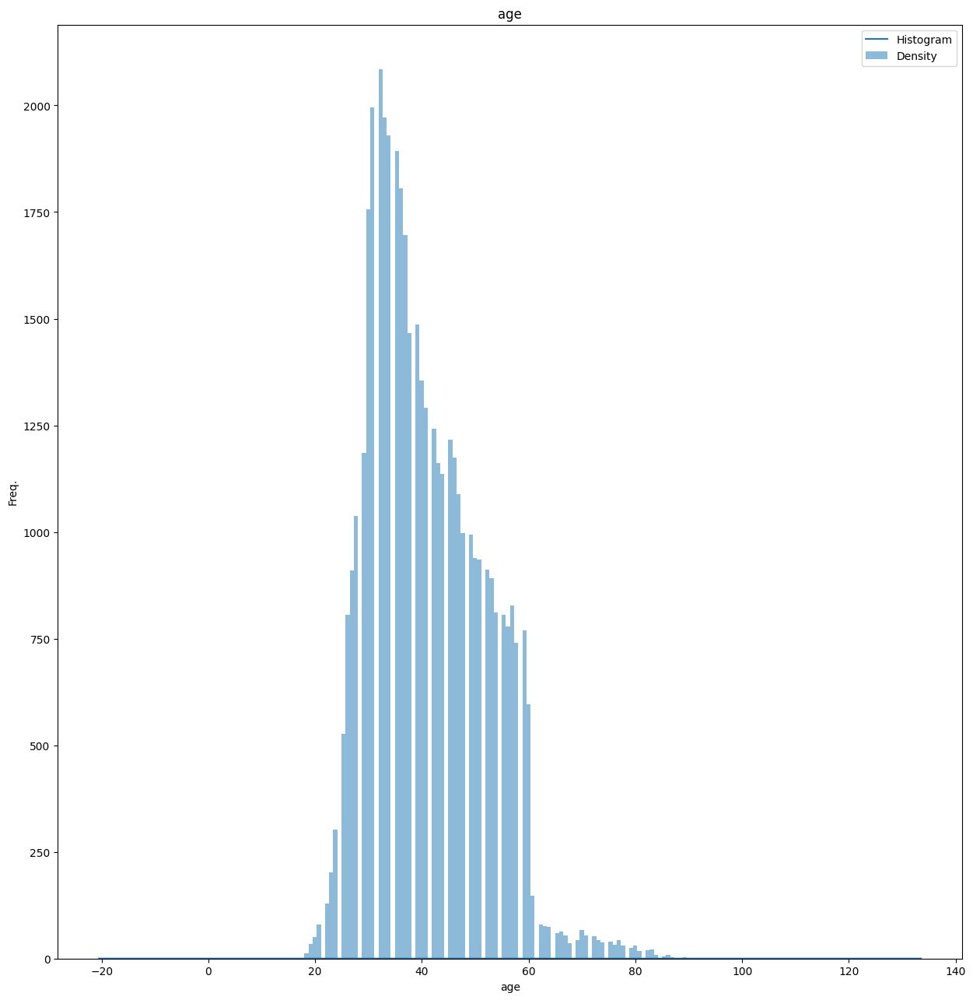

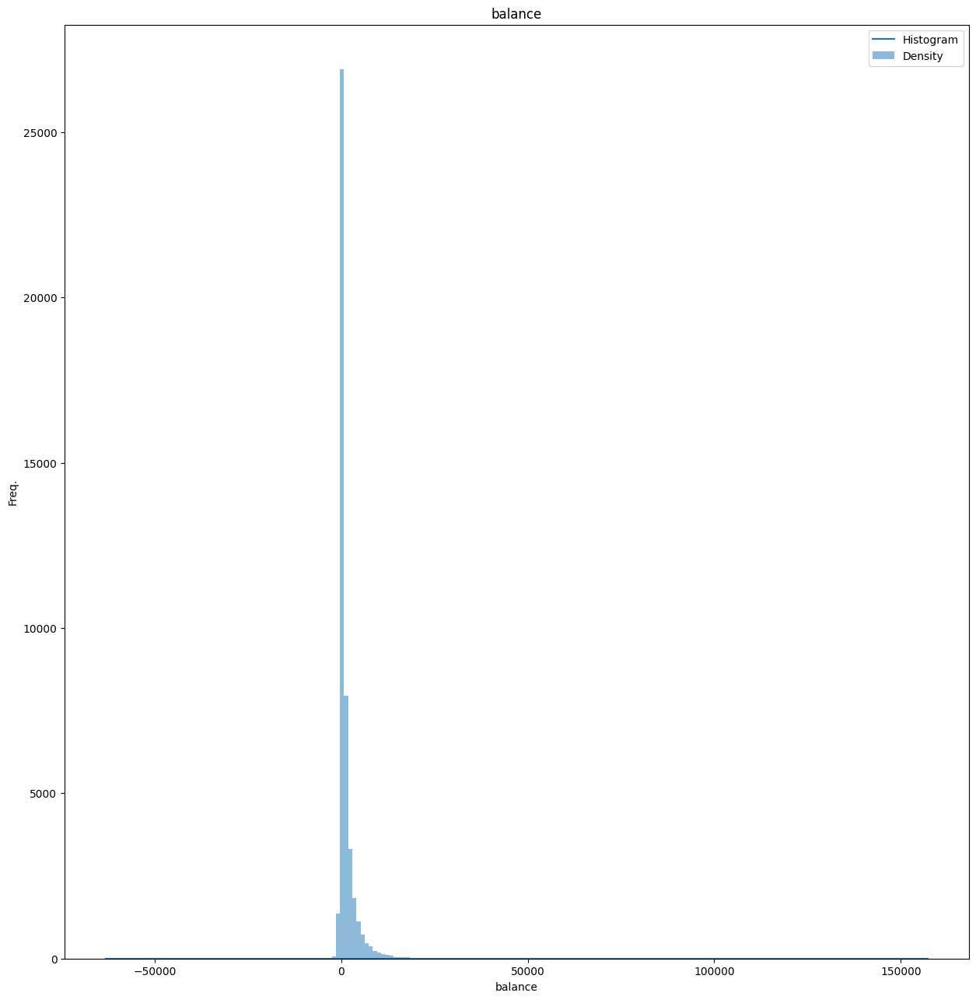

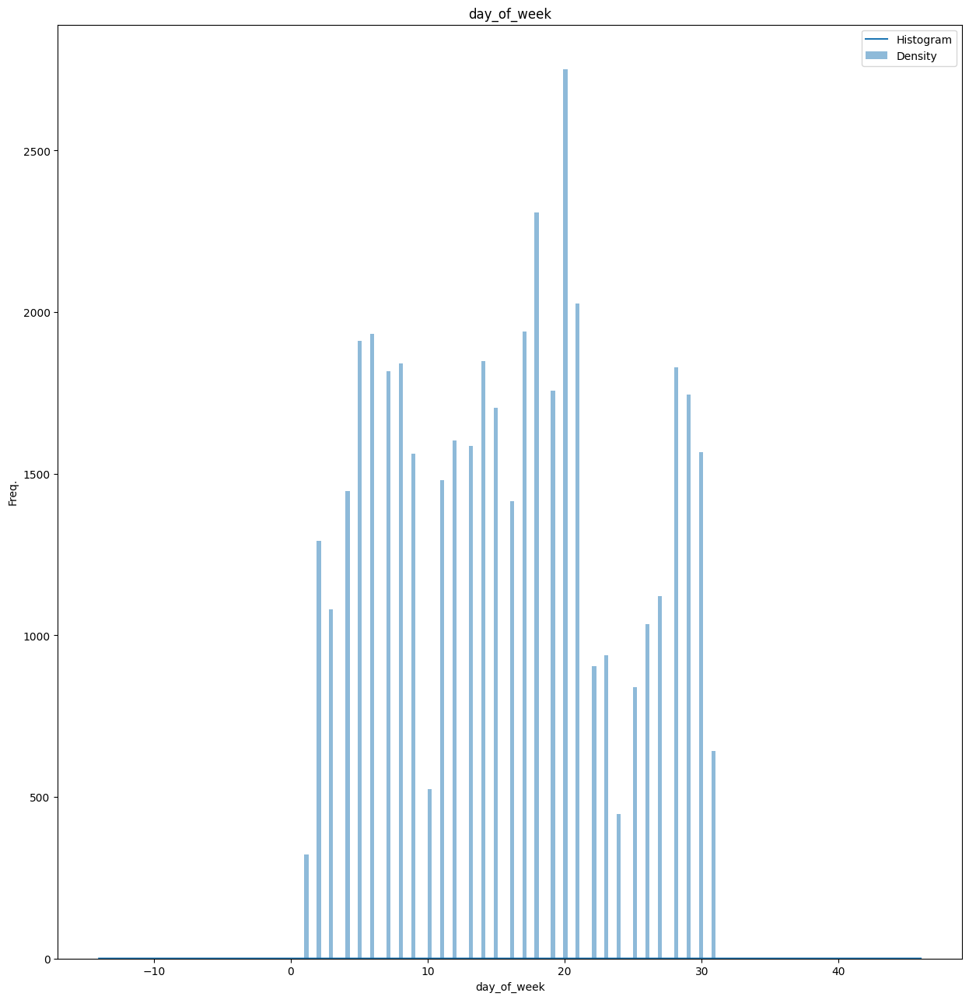

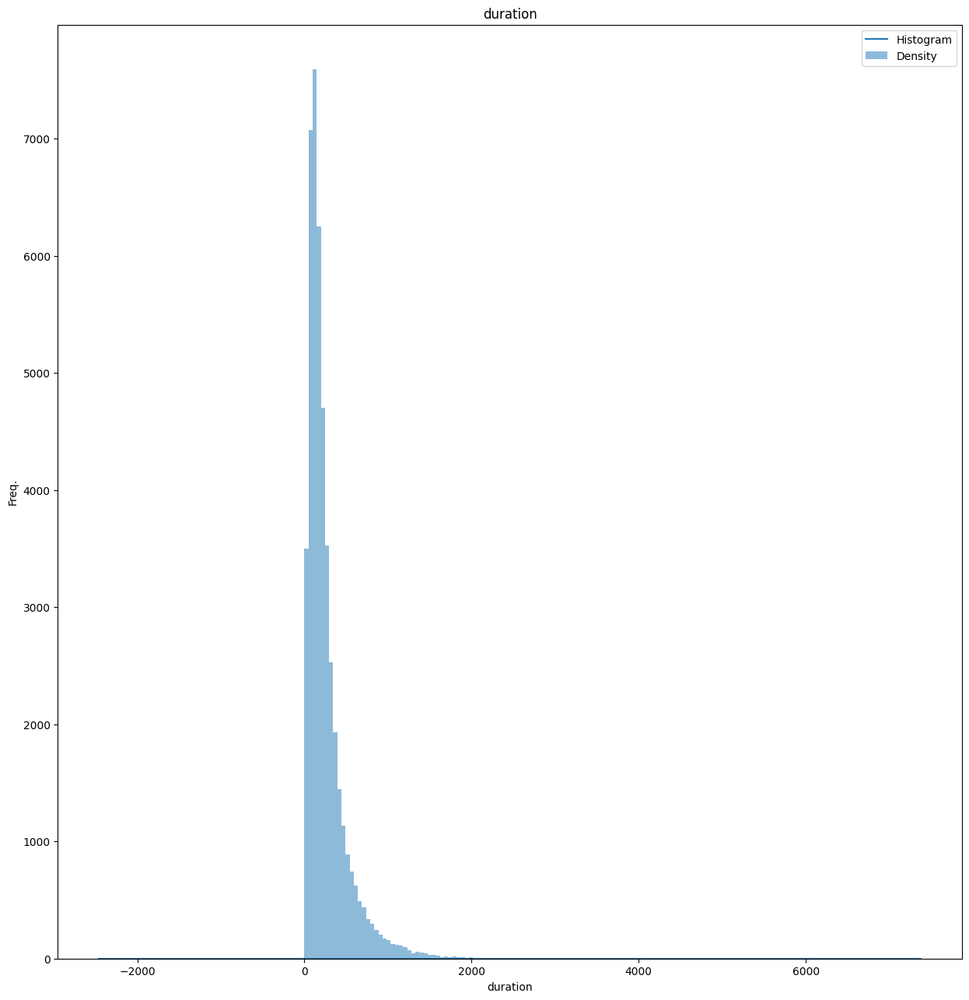

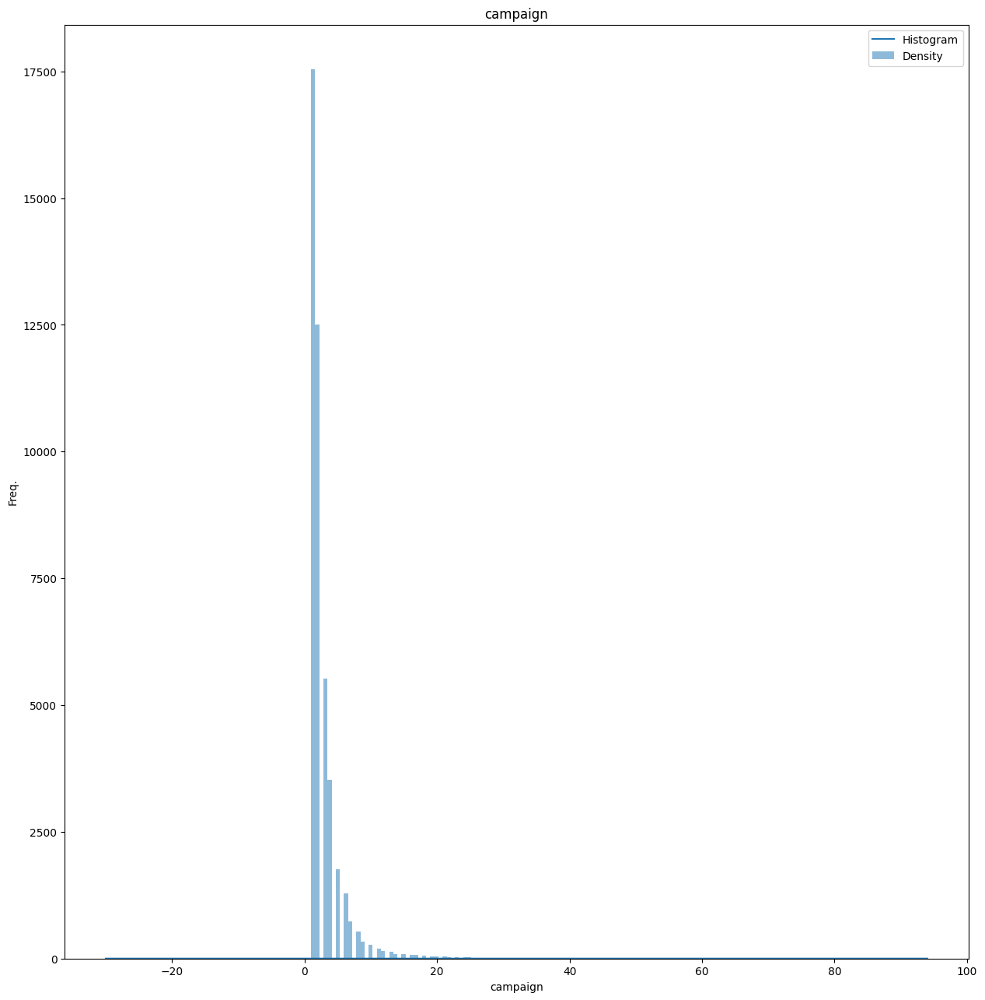

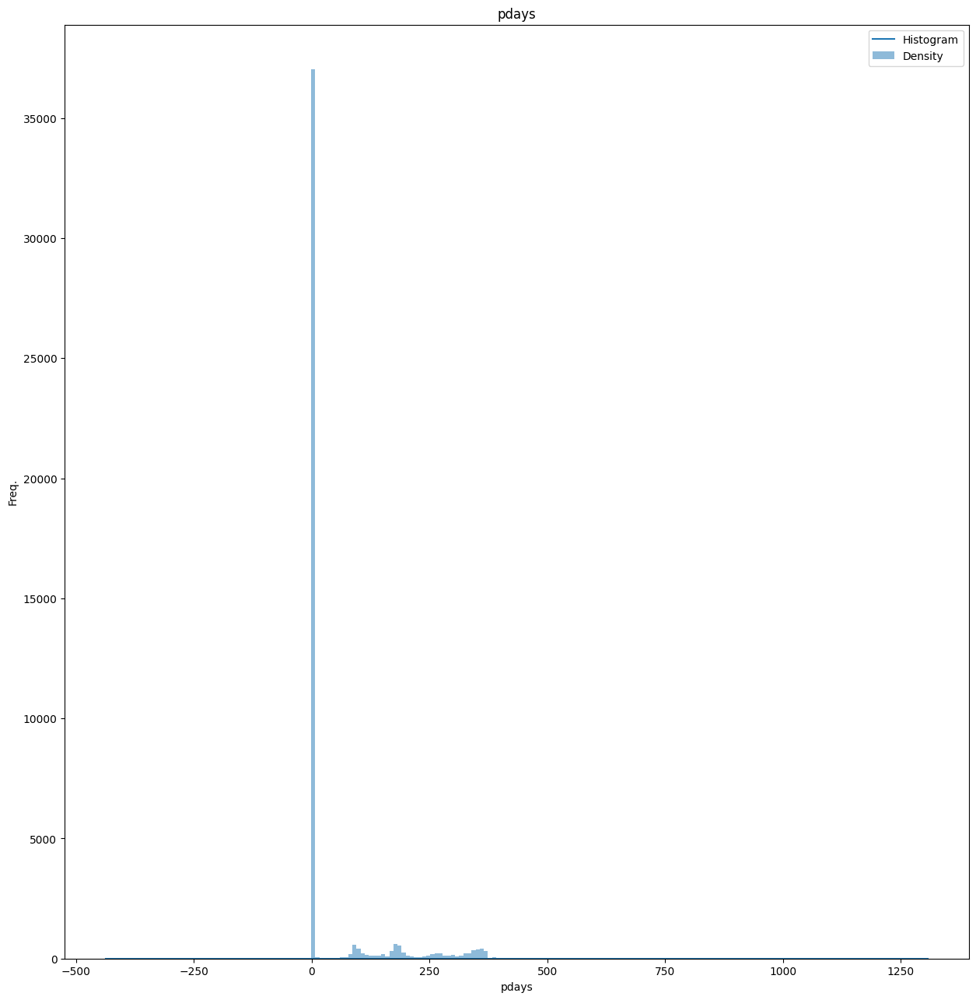

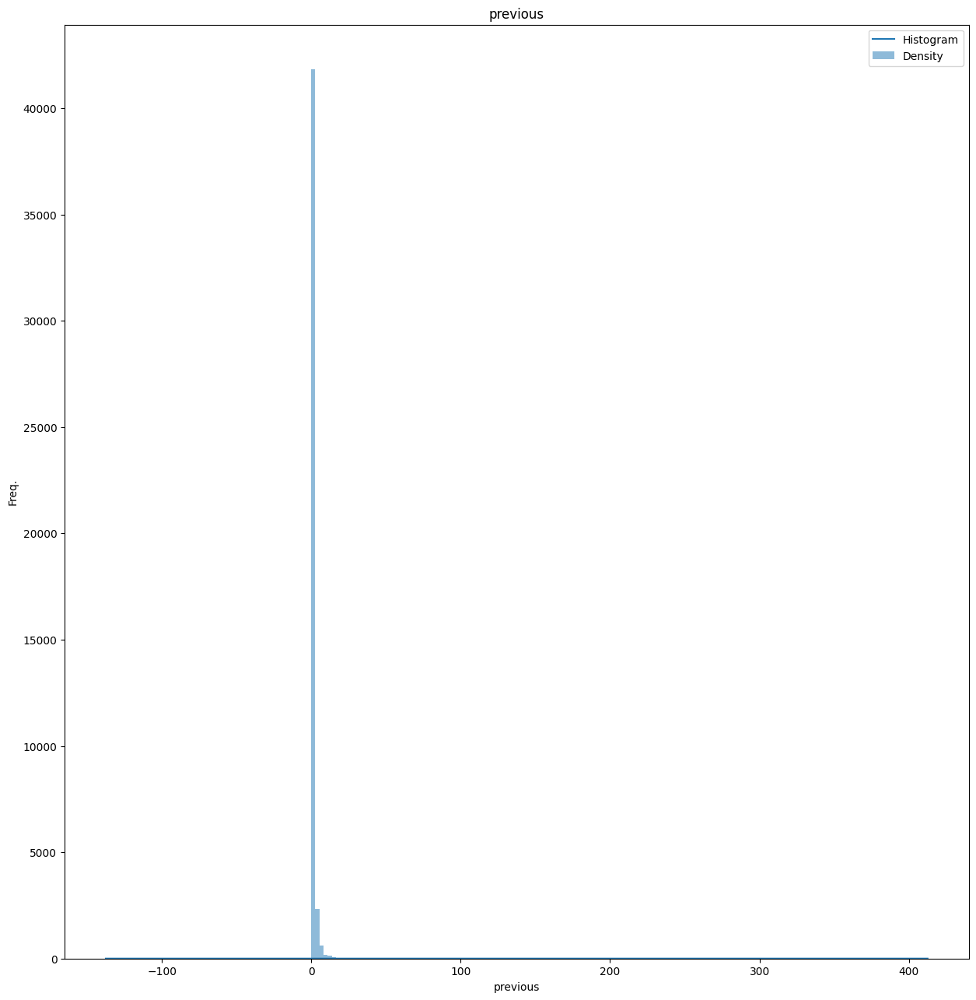

In [62]:

numeric_columns = []
df.dropna(subset = y.columns, inplace = True)
y.dropna(inplace=True)
print('Shape', df.shape)
catgeorical_columns = []
numeric_columns = []
for column in x.columns:
    if pd.api.types.is_numeric_dtype(df[column]):
        numeric_columns.append(column)
    else:
        catgeorical_columns.append(column)


print('Shape', df.shape)
print('Number of non NAN Values of column :', df.notna().sum())
print('Shape', df.shape)
plt.show()

In [63]:
df.drop(['contact', 'poutcome', 'duration'], axis = 1, inplace=True)

In [64]:
df.dropna(inplace=True)
x.dropna(inplace=True)
print(df.head())
numeric_df = df.select_dtypes(include="number")

   Unnamed: 0  age           job  marital  education default  balance housing  \
0           0   58    management  married   tertiary      no     2143     yes   
1           1   44    technician   single  secondary      no       29     yes   
2           2   33  entrepreneur  married  secondary      no        2     yes   
5           5   35    management  married   tertiary      no      231     yes   
6           6   28    management   single   tertiary      no      447     yes   

  loan  day_of_week month  campaign  pdays  previous   y  
0   no            5   may         1     -1         0  no  
1   no            5   may         1     -1         0  no  
2  yes            5   may         1     -1         0  no  
5   no            5   may         1     -1         0  no  
6  yes            5   may         1     -1         0  no  


<Figure size 640x480 with 0 Axes>

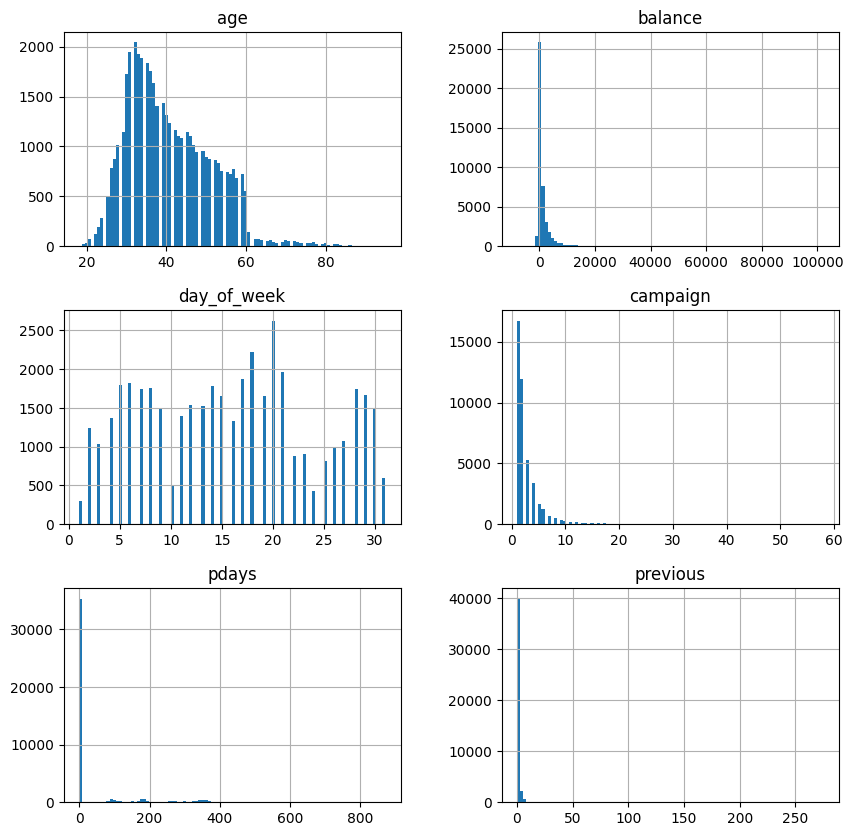

<Figure size 640x480 with 0 Axes>

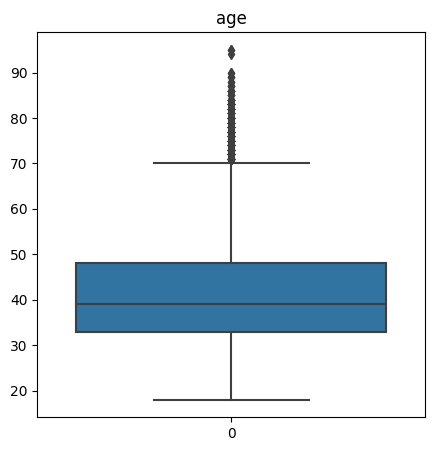

<Figure size 640x480 with 0 Axes>

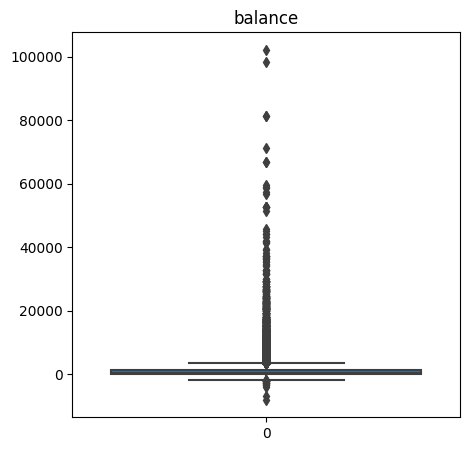

<Figure size 640x480 with 0 Axes>

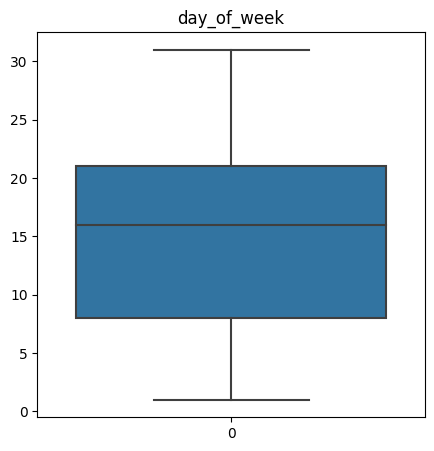

<Figure size 640x480 with 0 Axes>

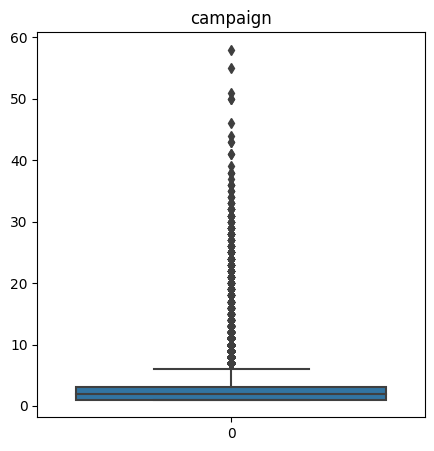

<Figure size 640x480 with 0 Axes>

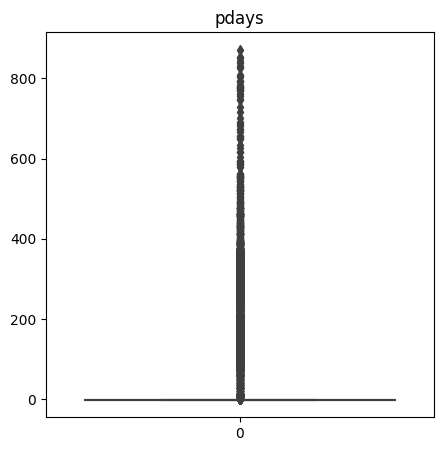

<Figure size 640x480 with 0 Axes>

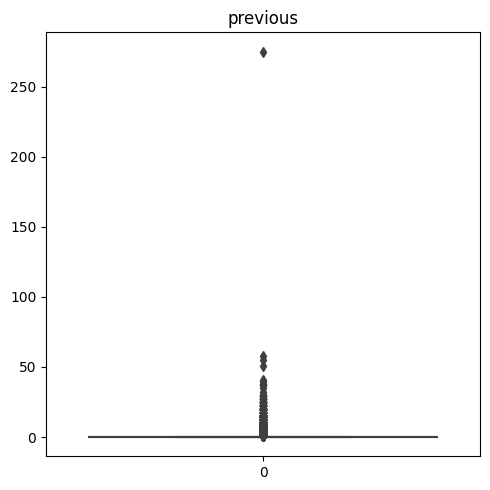

In [65]:
def removal_box_plot(df, column, threshold):
    sns.boxplot(df[column])
    plt.title(f'Original Box Plot of {column}')
    plt.show()
 
    removed_outliers = df[df[column] <= threshold]
 
    sns.boxplot(removed_outliers[column])
    plt.title(f'Box Plot without Outliers of {column}')
    plt.show()
    return removed_outliers

numeric_columns = []
for i, column in enumerate(df.columns):
    if pd.api.types.is_numeric_dtype(df[column]) and i != 0:
        numeric_columns.append(column)

plt.subplots_adjust(top=0.9, bottom=0.1, wspace=5)
df[numeric_columns].hist(figsize=(10,10), bins=100)

for i, column in enumerate(df.columns):
    if pd.api.types.is_numeric_dtype(df[column]) and i != 0:
        plt.figure()
        fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(5, 5)) 

        sns.boxplot(df[column], ax=axes)
        axes.set_title(column)

plt.tight_layout()
plt.show()

In [66]:
print((df['y'] == 'yes').sum(), ' Precentage: ', (df['y'] == 'yes').sum()/df.shape[0])
for column in df.columns:
    if pd.api.types.is_numeric_dtype(df[column]):
        if column not in ['previous', 'pdays']:
            Q1 = df[column].quantile(0.25)
            Q3 = df[column].quantile(0.75)
            IQR = Q3 - Q1
            lower = Q1 - 1.5*IQR
            upper = Q3 + 1.5*IQR
            upper_array = np.where(df[column] >= upper)[0]
            lower_array = np.where(df[column] <= lower)[0]
            upper_array = [idx for idx in upper_array if idx in df.index]
            lower_array = [idx for idx in lower_array if idx in df.index]
            df = df[(df[column] >= lower) & (df[column] <= upper)]
            print(df.shape)
print((df['y'] == 'yes').sum(), ' Precentage: ', (df['y'] == 'yes').sum()/df.shape[0])


5021  Precentage:  0.11624568795869701
(43193, 15)
(42759, 15)
(38253, 15)
(38253, 15)
(35651, 15)
4003  Precentage:  0.11228296541471487


In [67]:
print(df[df['y'] == 'yes'].shape)
df_new = pd.concat([df[df['y'] == 'yes'].head(4000).reset_index(drop=True), 
                          df[df['y'] == 'no'].tail(4000).reset_index(drop=True)], ignore_index=False).sort_index(kind='merge')
df_head = df_new.tail(4000)
print((df_head['y'] == 'no').sum())

(4003, 15)
2000


In [68]:
df.head()

,Unnamed: 0,age,job,marital,education,default,balance,housing,loan,day_of_week,month,campaign,pdays,previous,y
0,0,58,management,married,tertiary,no,2143,yes,no,5,may,1,-1,0,no
1,1,44,technician,single,secondary,no,29,yes,no,5,may,1,-1,0,no
2,2,33,entrepreneur,married,secondary,no,2,yes,yes,5,may,1,-1,0,no
5,5,35,management,married,tertiary,no,231,yes,no,5,may,1,-1,0,no
6,6,28,management,single,tertiary,no,447,yes,yes,5,may,1,-1,0,no


C:\Users\Mahmoud Hisham\AppData\Local\Temp\ipykernel_26652\456635585.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.drop(df.columns[0], axis=1).corr(), annot=True)


<AxesSubplot: >

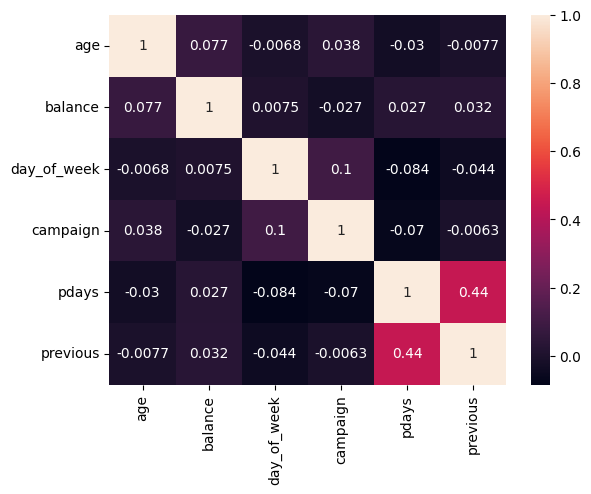

In [69]:
sns.heatmap(df.drop(df.columns[0], axis=1).corr(), annot=True)

campaign


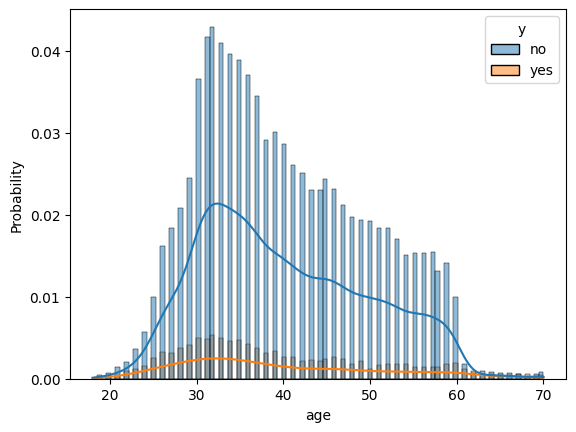

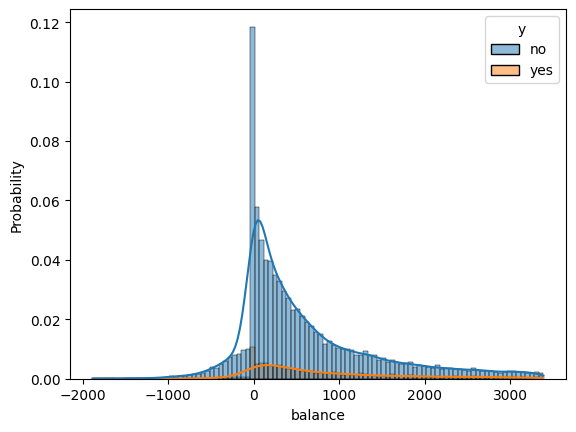

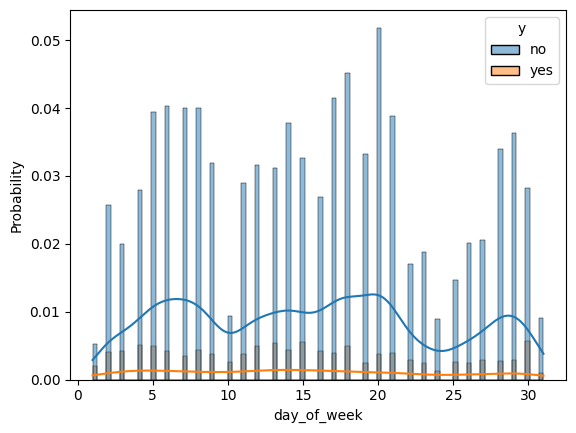

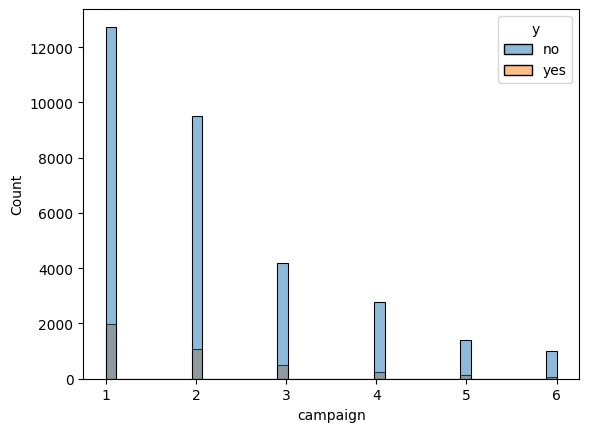

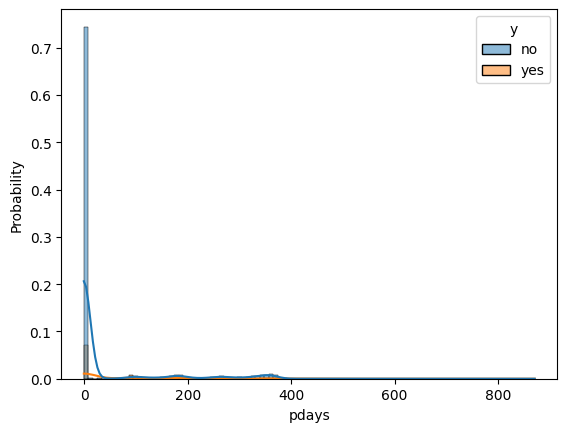

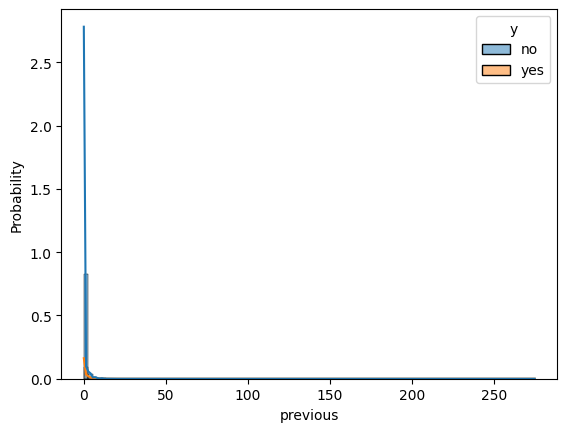

In [70]:
for column in numeric_columns:
    if df[column].nunique() > 10:
        plt.figure()
        sns.histplot(data = df, x = column, stat = "probability", kde = True, hue = "y", bins=100)
    else:
        plt.figure()
        print(column)
        sns.histplot(data = df, x = column, hue = "y")

c:\Users\Mahmoud Hisham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:447: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


0         no
1         no
2         no
5         no
6         no
        ... 
45203    yes
45205    yes
45206    yes
45209     no
45210     no
Name: y, Length: 35651, dtype: object

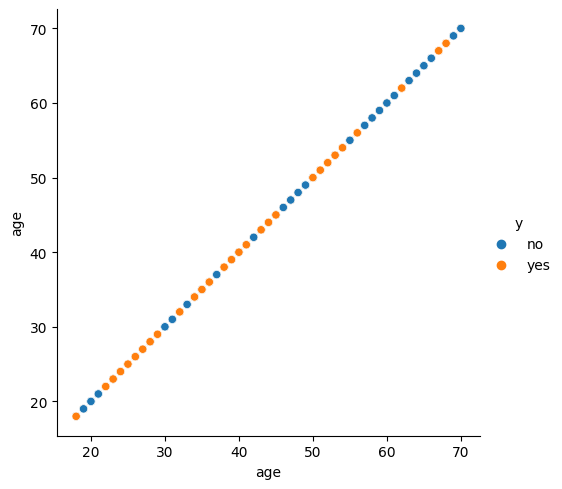

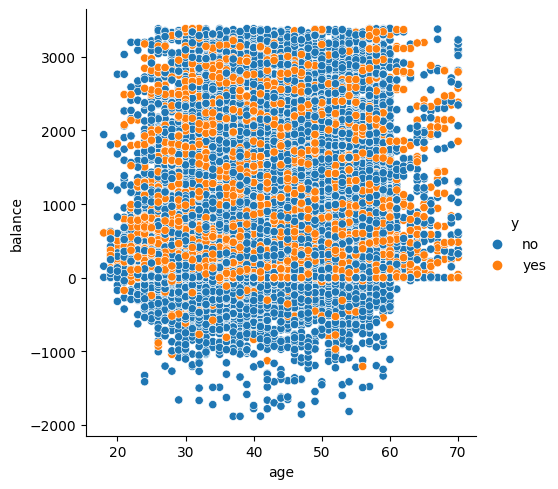

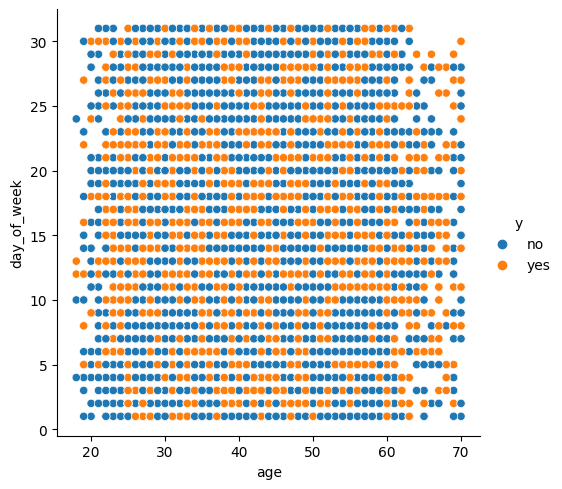

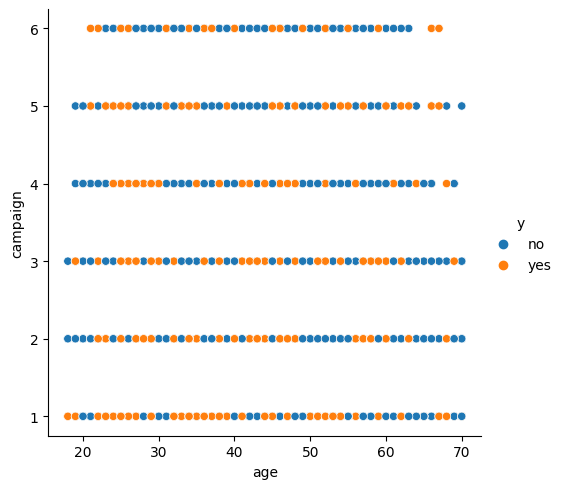

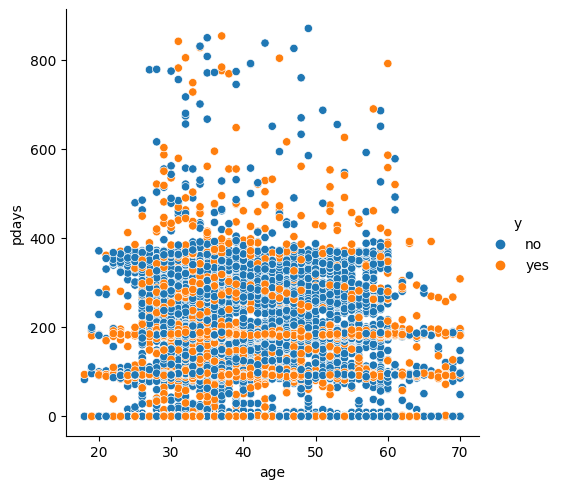

...

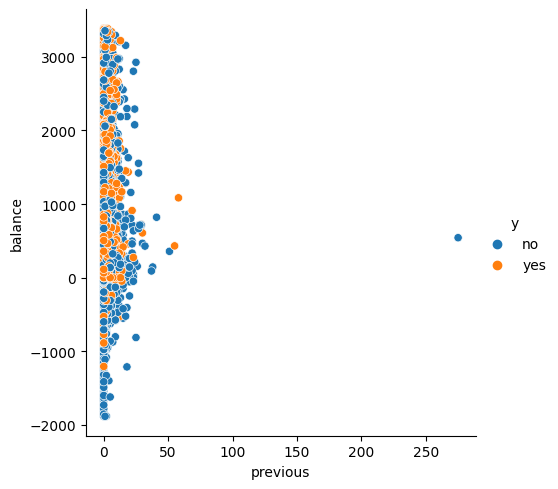

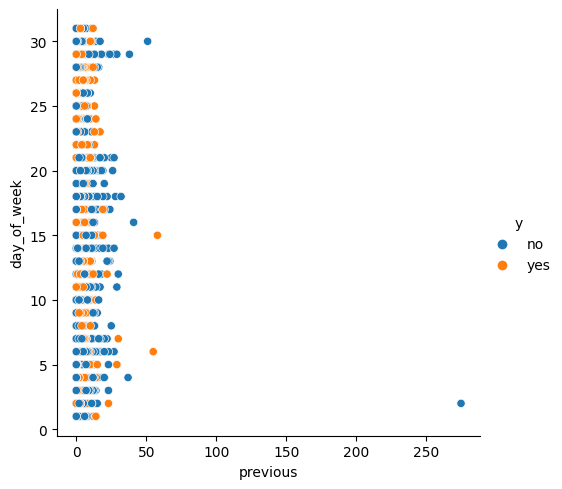

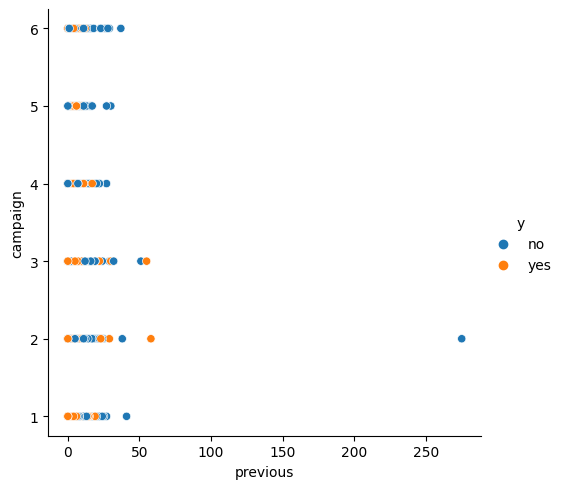

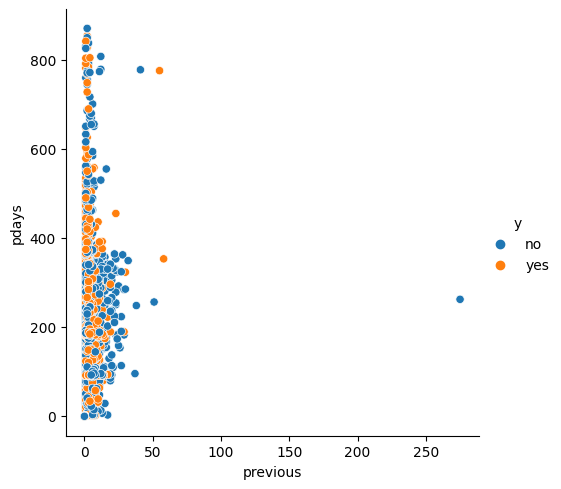

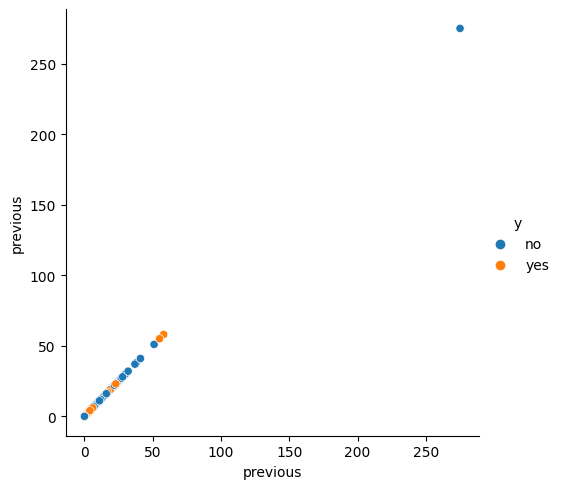

In [71]:
df_encoded_target = df.copy()
for column in numeric_columns:   
    for column_2 in numeric_columns: # alternative for pairplot function
        sns.relplot(
            data=df,
            x=column, y=column_2, hue="y"
        )

df_encoded_target['y']

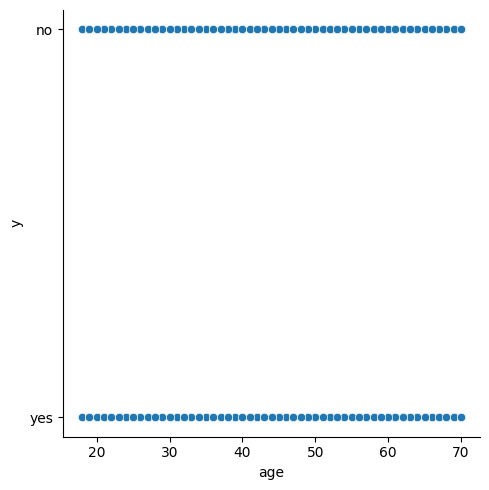

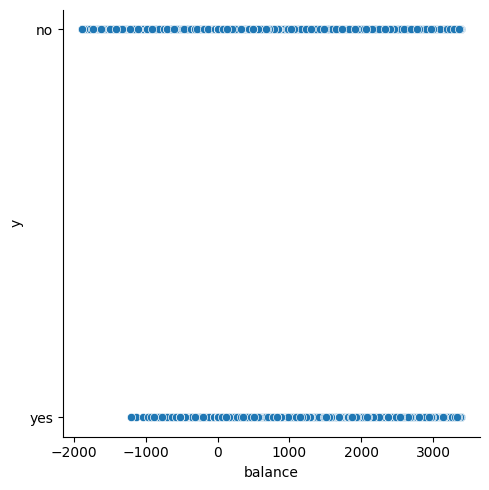

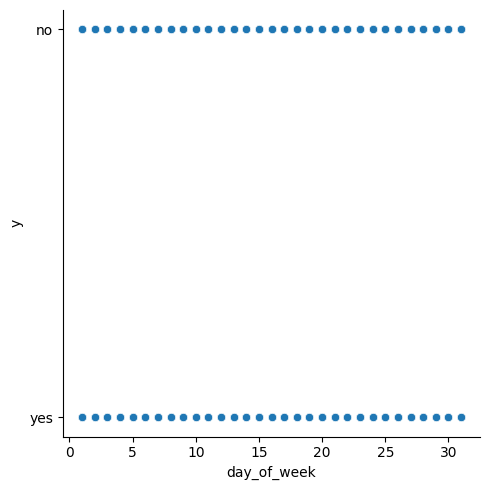

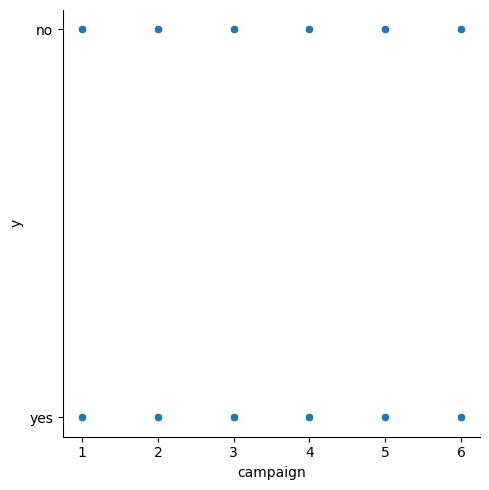

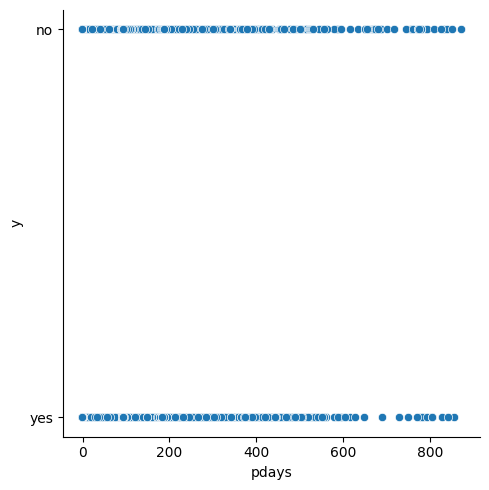

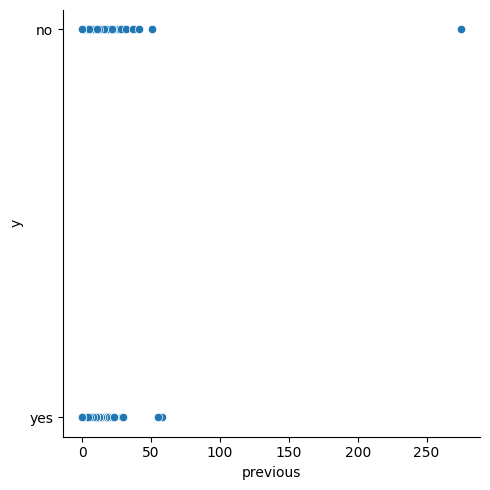

In [72]:
for column in numeric_columns:
    sns.relplot(data=df, x=column, y='y')

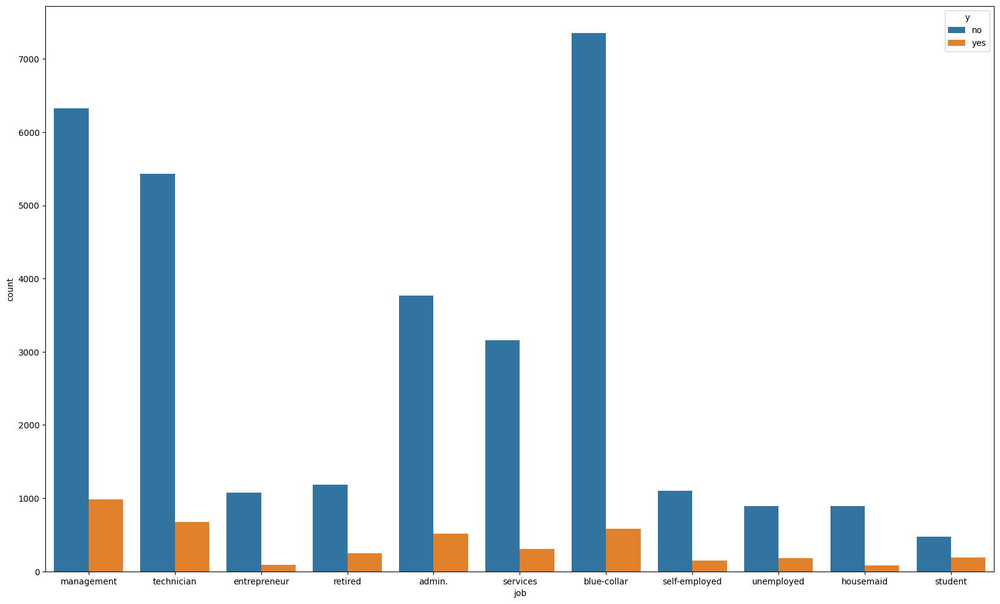

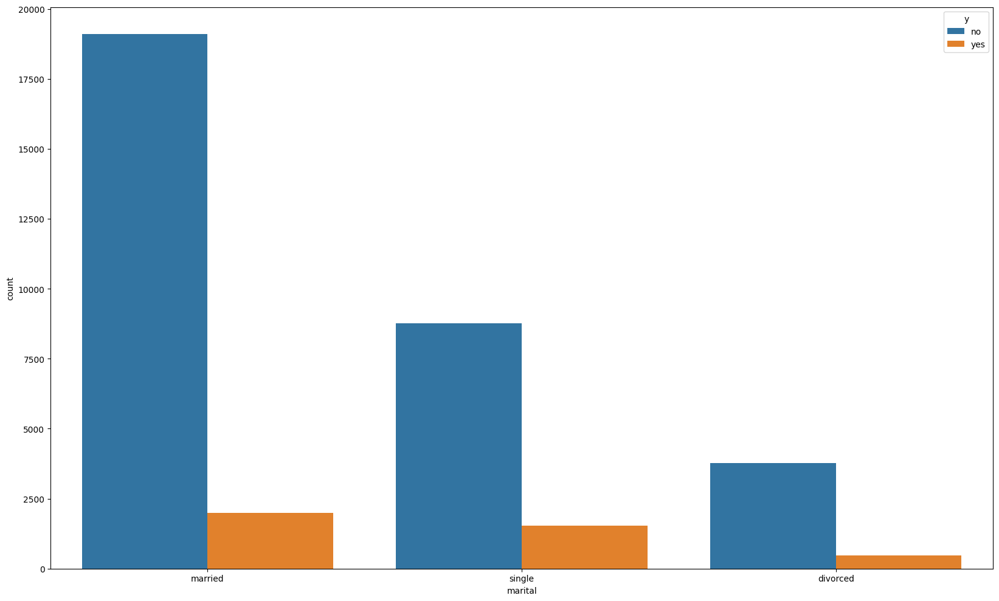

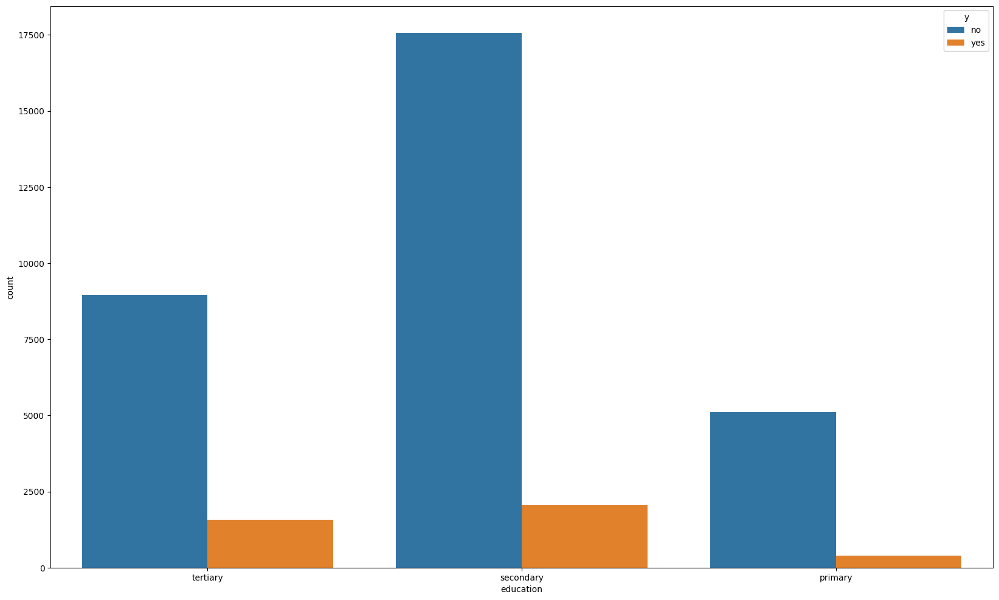

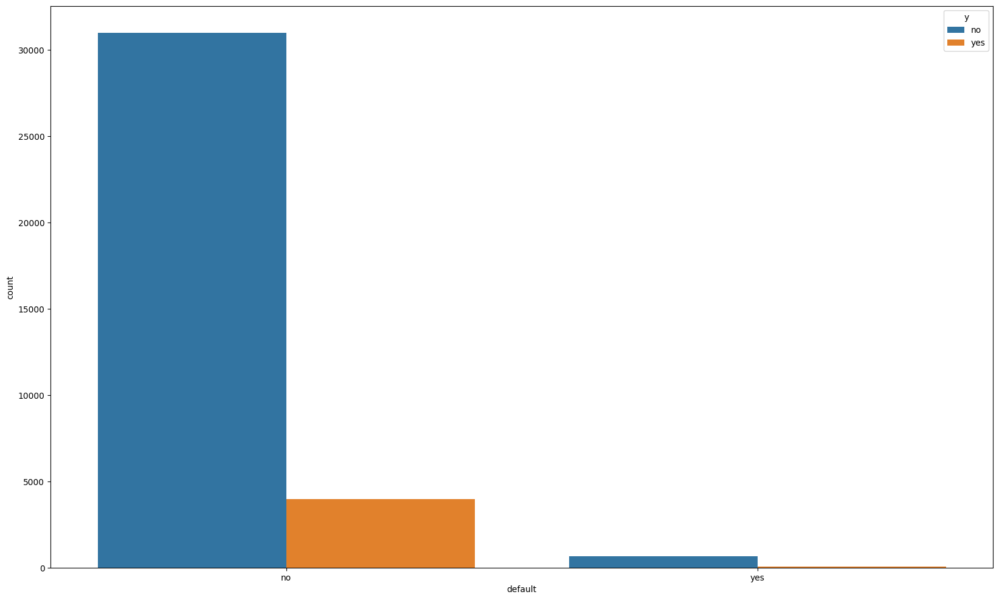

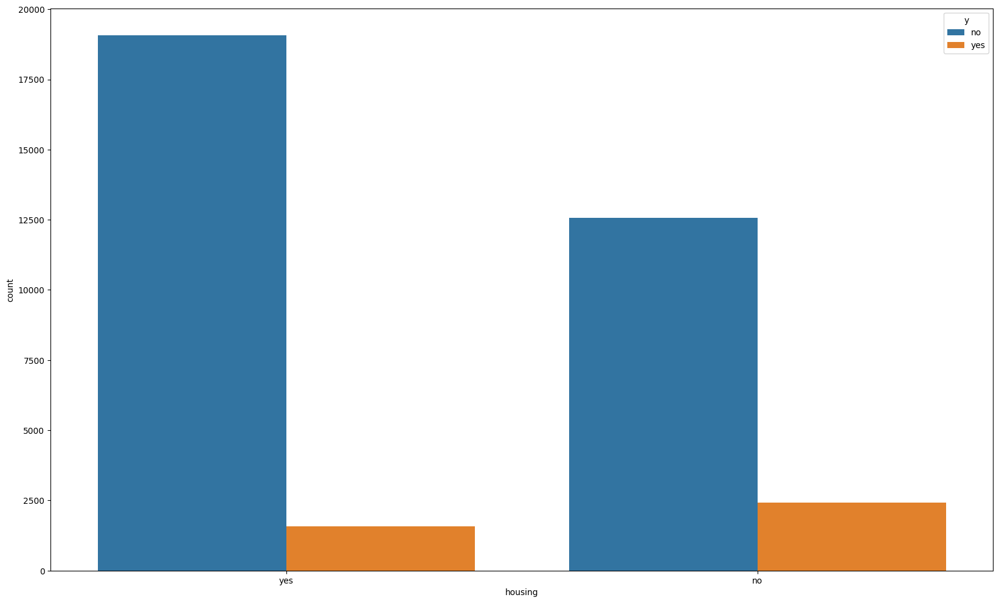

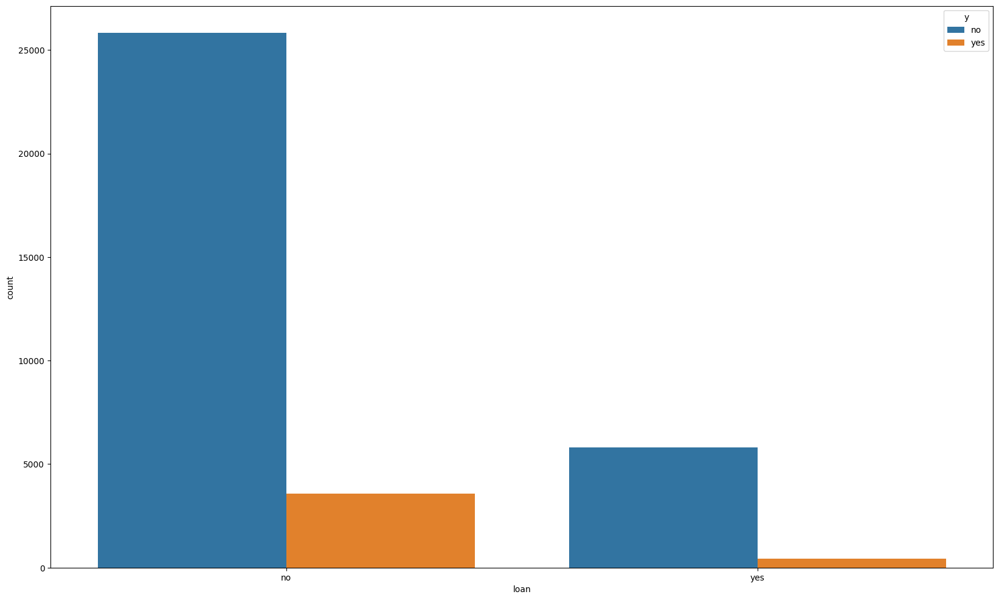

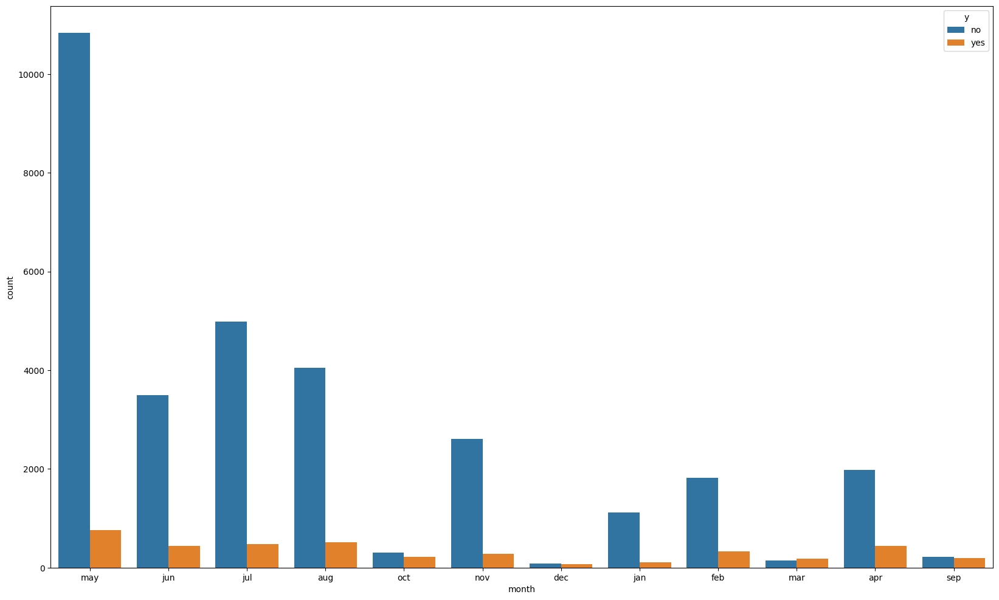

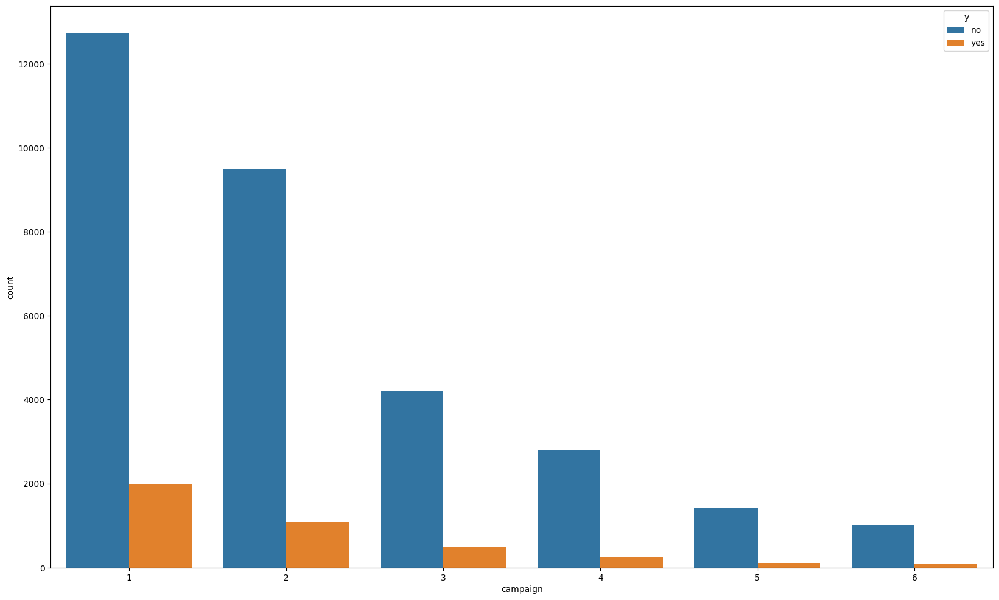

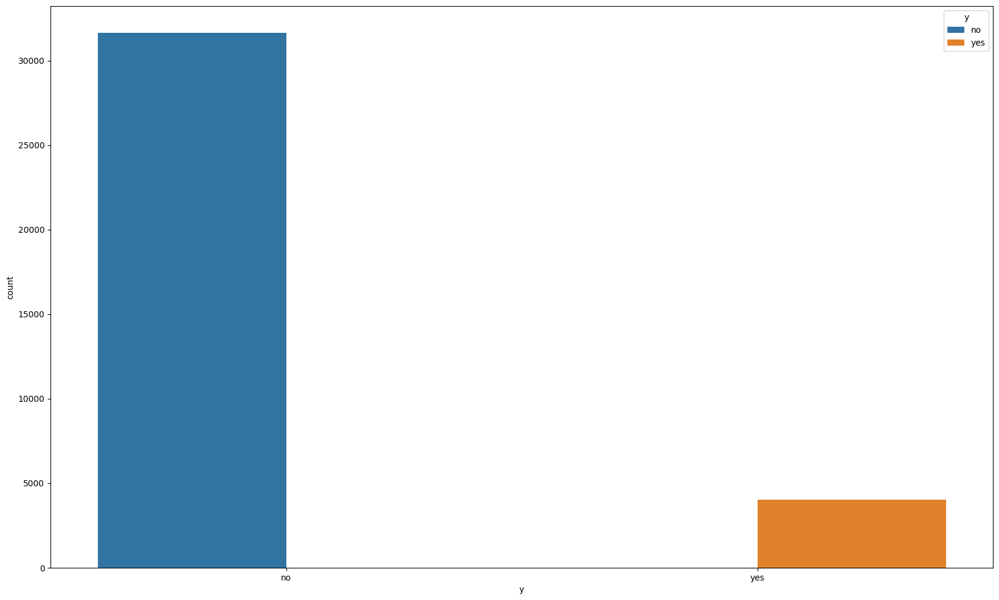

In [73]:
for column in df.columns:
    if df[column].nunique() < 15:
        plt.figure(figsize=(20,12))
        sns.countplot(x=column, hue='y', data=df)

In [74]:
def one_hot_encode(df, column_name):
    if column_name in df.columns:
        df_encoded = pd.get_dummies(df[column_name], prefix=column_name, dtype=int)
        df.drop(column_name, axis=1, inplace=True)
        df = pd.concat([df, df_encoded], axis=1)
        print("One-hot encoding applied to column ", column_name, " successfully.")
        return df
    else:
        print(f"Column '{column_name}' not found in the DataFrame.")


df_encoded = df.replace(['yes', 'no'], [1, 0])
df_encoded.replace(['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec'], 
                   [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], inplace=True)
df_encoded = one_hot_encode(df_encoded, 'job')
df_encoded = one_hot_encode(df_encoded, 'education')
df_encoded = one_hot_encode(df_encoded, 'marital')
print(df_encoded)

One-hot encoding applied to column  job  successfully.
One-hot encoding applied to column  education  successfully.
One-hot encoding applied to column  marital  successfully.
       Unnamed: 0  age  default  balance  housing  loan  day_of_week  month  \
0               0   58        0     2143        1     0            5      5   
1               1   44        0       29        1     0            5      5   
2               2   33        0        2        1     1            5      5   
5               5   35        0      231        1     0            5      5   
6               6   28        0      447        1     1            5      5   
...           ...  ...      ...      ...      ...   ...          ...    ...   
45203       45203   23        0      113        0     0           17     11   
45205       45205   25        0      505        0     1           17     11   
45206       45206   51        0      825        0     0           17     11   
45209       45209   57        0    

In [76]:
std_scaler = StandardScaler()

df_scaled = std_scaler.fit_transform(df_encoded.drop('y', axis=1).values)

df_scaled = pd.DataFrame(df_scaled, columns=df_encoded.drop('y', axis=1).columns)

df_scaled['y'] = df['y']

df_scaled.index = df_encoded.index

In [77]:
dim_red = PCA()
x_pca = dim_red.fit_transform(df_scaled.drop('y', axis=1))
print(x_pca.shape)
print(dim_red.components_)
print(x_pca.shape)

(35651, 28)
[[ 2.03534612e-01 -2.14556699e-01 -2.04105272e-02  6.35780636e-02
  -1.17349301e-01 -8.25266861e-02  4.43207394e-03  4.25482242e-02
  -2.62303341e-02  8.03478224e-02  8.25972358e-02 -4.21340553e-02
  -2.92197364e-01  9.42808807e-03 -6.38307864e-02  3.90516287e-01
  -1.05143494e-01  5.25863945e-02 -9.08715727e-02  1.24884575e-01
   2.02248570e-02 -1.67364345e-03 -2.30257955e-01 -2.82271215e-01
   4.90306387e-01  4.16882285e-03 -3.17130035e-01  3.40750378e-01]
 [ 6.07711009e-02 -3.40524238e-01  7.97562262e-03 -7.75097226e-02
   1.36531368e-01  1.44904204e-02 -3.11012322e-02 -1.45701547e-01
  -7.67580843e-02  1.12224735e-01  6.18021562e-02  1.96236372e-01
  -1.08227157e-02 -6.30338735e-02 -1.10071135e-01 -2.81714623e-01
  -1.64956446e-01 -4.31359004e-02  1.59638081e-01  1.52973772e-01
   1.44243162e-01  8.61637936e-03 -2.50047331e-01  4.47297949e-01
  -2.89665009e-01  1.58891596e-02 -3.31698038e-01  3.48181251e-01]
 [ 4.52798356e-01  5.67847615e-02 -1.01550509e-01  1.20150195e

In [78]:
print(dim_red.explained_variance_ratio_)
print(dim_red.get_feature_names_out())
print(df_encoded['y'].isna().sum(), df_scaled['y'].isna().sum(), df['y'].isna().sum())
print(x_pca.shape)

[9.17726798e-02 8.60757285e-02 6.44911666e-02 5.98161435e-02
 5.20692513e-02 4.78912281e-02 4.26136049e-02 4.09605721e-02
 4.00204779e-02 3.86296833e-02 3.76394036e-02 3.72856961e-02
 3.70844903e-02 3.68280347e-02 3.41368108e-02 3.34382531e-02
 3.20244911e-02 3.14739127e-02 2.94341000e-02 2.73643508e-02
 2.67973614e-02 2.38915030e-02 1.79445256e-02 1.55208537e-02
 1.47956773e-02 2.87075583e-32 7.05446045e-33 4.86227922e-33]
['pca0' 'pca1' 'pca2' 'pca3' 'pca4' 'pca5' 'pca6' 'pca7' 'pca8' 'pca9'
 'pca10' 'pca11' 'pca12' 'pca13' 'pca14' 'pca15' 'pca16' 'pca17' 'pca18'
 'pca19' 'pca20' 'pca21' 'pca22' 'pca23' 'pca24' 'pca25' 'pca26' 'pca27']
0 7446 0
(35651, 28)


In [79]:
training_features = ['pca0', 'pca1', 'pca2', 'pca3', 'pca4', 'pca5', 'pca6', 'pca7', 'pca8', 'pca9']
df_pca = pd.DataFrame(x_pca, columns=dim_red.get_feature_names_out())
print(df_pca.shape)
print(df_encoded['y'].isna().sum(), df_scaled['y'].isna().sum(), df['y'].isna().sum())


(35651, 28)
0 7446 0


In [80]:
df_pca_working_set = df_pca[training_features]
df_pca_working_set = df_pca_working_set.reset_index(drop=True)
df_max_scaled_reset_index = df_scaled.reset_index(drop=True)
df_pca_working_set['y'] = df_max_scaled_reset_index['y']
non_numeric_values_exist = df_pca_working_set.isna().any().any()
if non_numeric_values_exist:
    print("There are non-numeric values in the DataFrame.")
else:
    print("All values in the DataFrame are numeric.")



There are non-numeric values in the DataFrame.


c:\Users\Mahmoud Hisham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:447: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


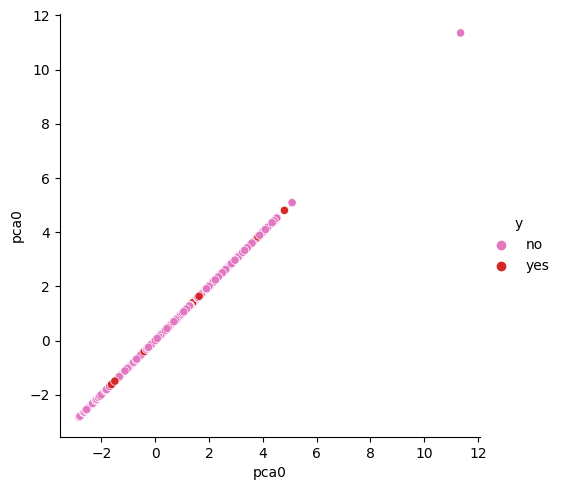

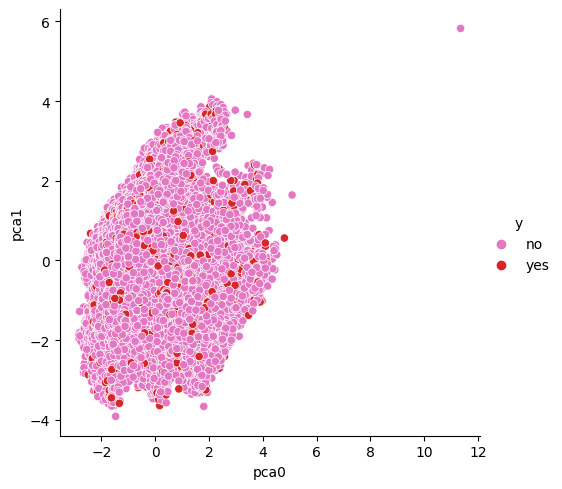

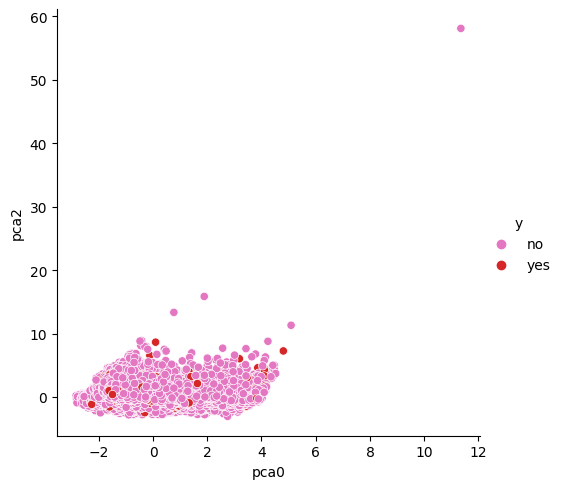

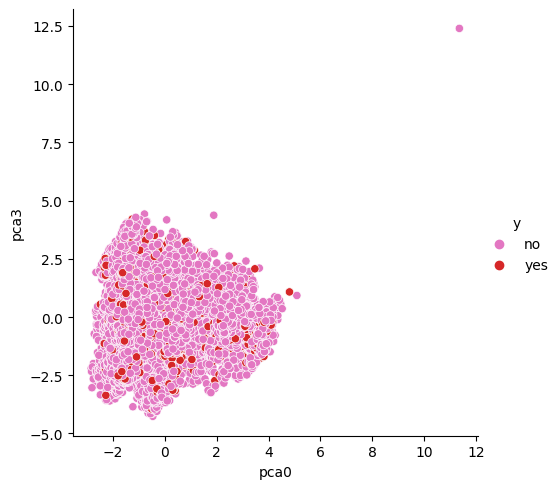

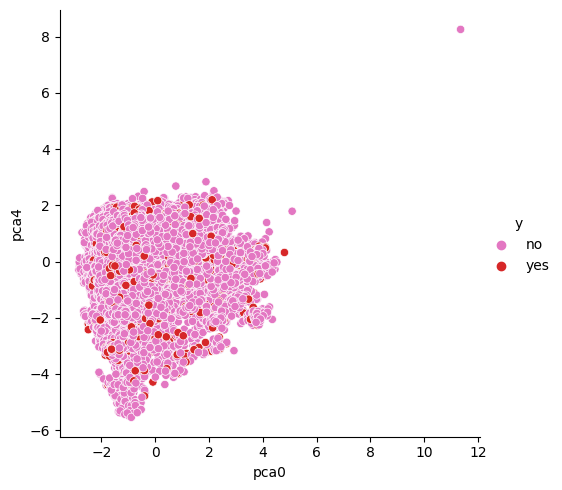

...

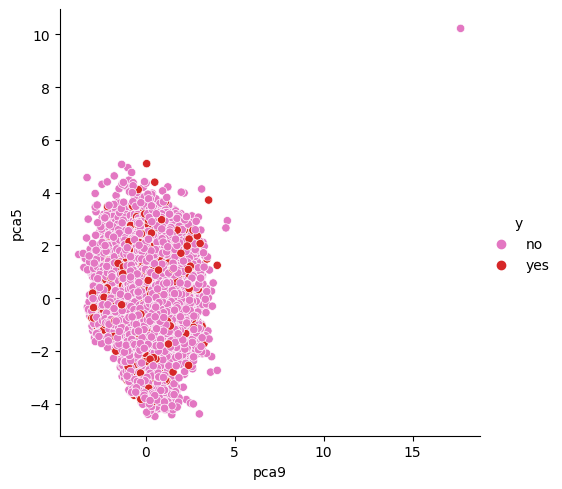

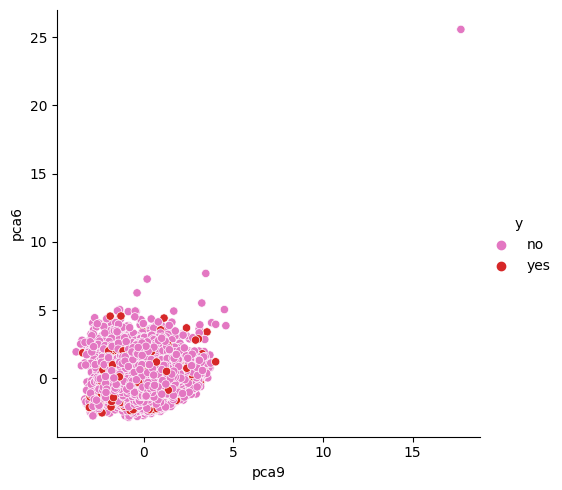

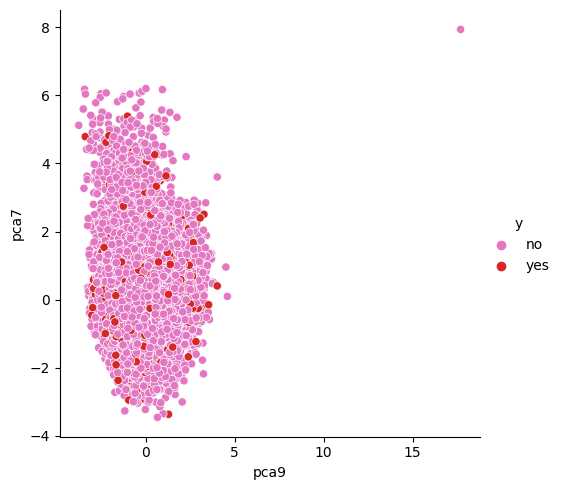

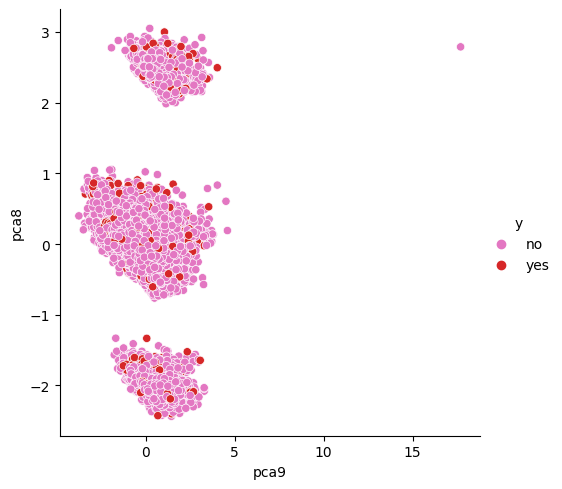

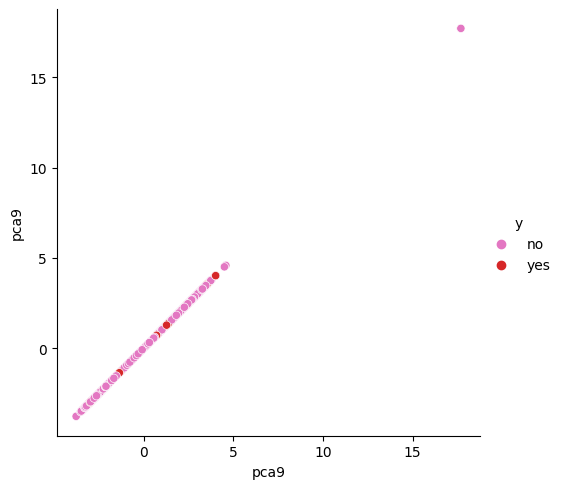

In [81]:
for column in training_features:
    for column_2 in training_features:
        sns.relplot(x=column, y=column_2, data=df_pca_working_set, hue='y', palette='tab10_r')